# Project [SCP]: SPY Correlation Prediction on selected stocks

* Objective: Predict the correlation of GOOG, AMZN, JPM, GME, and XOM with the SPY index for
the next two months using only historical prices.
* Instructions:
  * Data Collection: Download the historical price data for the stocks GOOG, AMZN, JPM,
GME, XOM, and the SPY index from Yahoo Finance or other sources. Ensure to account
for corporate adjustments.
  * Data Preprocessing: Clean the data by handling any missing values, outliers, or
anomalies. Check for corporate adjustments and account for them.
  * Model Selection: Choose an appropriate model to predict future correlations.
Consider models suitable for time series forecasting.
  * Model Training and Validation: Train the chosen model using historical correlations and
validate its performance.
  * Evaluation: Assess the model's predictive accuracy using suitable metrics.
  * Report: Present your findings detailing the approach, choice of model, and achieved
results. Please attach your code.

### 0. Imports and Configs

In [48]:
import copy
import json
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import seaborn as sns
from plotly.subplots import make_subplots
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from xbbg import blp
from gluonts.torch.model.deepar import DeepAREstimator
from gluonts.model.predictor import Predictor
from pathlib import Path
import os
from script.data_loader import load_px, load_ret, load_corr
from script.utils import get_forecast, get_deep_ar_forecast, plot_forecast
from gluonts.dataset.pandas import PandasDataset
sns.set_theme()

ImportError: cannot import name 'get_forecast' from 'script.utils' (C:\Users\jessi\macro_pred\scp\script\utils.py)

In [2]:
stocks = sorted(['GOOG', 'AMZN', 'JPM', 'GME', 'XOM'])
tickers = sorted(['GOOG', 'AMZN', 'JPM', 'GME', 'XOM', 'SPY'])
window = 42  # predict the next two months correlation ~ 42 trading days
start_date, end_date = '2015-09-30', '2023-09-28'

### 1. Data Collection

We download the historical price data from Yahoo Finance, it contains many columns - 

* Date: This is the index in our time series that specifies the date associated with the price.
* Close: The last price at stock was executed on that day.
* Adj Close: The closing price adjusted for dividends and stock splits.

We’ll use the Adj close price to account for corporate adjustments.

In [3]:
close = load_px(tickers, start_date, end_date)
close

,AMZN,GME,GOOG,JPM,SPY,XOM
Date,,,,,,
2015-09-30,25.594500,7.869444,30.421000,48.647751,166.114975,51.457741
2015-10-01,26.035999,7.737682,30.564501,49.006809,166.548386,51.257030
2015-10-02,26.627001,7.924822,31.345501,48.870186,169.036240,52.516670
2015-10-05,27.184000,8.111964,32.073502,49.842594,172.044281,53.160320
2015-10-06,26.874001,8.276188,32.271999,49.866711,171.454758,53.907787
...,...,...,...,...,...,...
2023-09-21,129.330002,17.020000,131.360001,147.139999,431.390015,114.760002
2023-09-22,129.119995,17.180000,131.250000,145.729996,430.420013,114.940002
2023-09-25,131.270004,17.670000,132.169998,146.449997,432.230011,116.230003


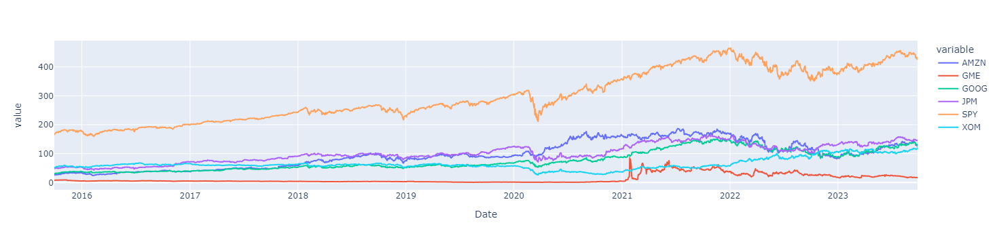

In [139]:
close.plot(backend='plotly')

To cross-check, we also download price from Bloomberg as a validation in Data Preprocessing. Please note we apply `all` adjustments to get adjust close.

```
    adjust: `all`, `dvd`, `normal`, `abn` (=abnormal), `split`, `-` or None
            exact match of above words will adjust for corresponding events
            Case 0: `-` no adjustment for dividend or split
            Case 1: `dvd` or `normal|abn` will adjust for all dividends except splits
            Case 2: `adjust` will adjust for splits and ignore all dividends
            Case 3: `all` == `dvd|split` == adjust for all
            Case 4: None == Bloomberg default OR use kwargs         
```

In [140]:
# close_blp = bdh([t + ' US Equity' for t in tickers], flds=['PX_LAST'], start_date=close.index[0],
#                     adjust='all').droplevel(1, 1)
# close_blp.columns = close_blp.columns.str[:-10]
# close_blp.to_csv('PX_LAST.csv')

close_blp = pd.read_csv('data/PX_LAST.csv', index_col=0, parse_dates=True)
close_blp

,AMZN,GME,GOOG,JPM,SPY,XOM
2015-09-30,25.595,7.8695,30.421,48.6478,166.1146,51.4578
2015-10-01,26.036,7.7377,30.565,49.0069,166.5480,51.2571
2015-10-02,26.627,7.9248,31.345,48.8703,169.0359,52.5168
2015-10-05,27.184,8.1120,32.074,49.8427,172.0438,53.1604
2015-10-06,26.874,8.2762,32.272,49.8668,171.4544,53.9079
...,...,...,...,...,...,...
2023-09-25,131.270,17.6700,132.170,146.4500,432.2300,116.2300
2023-09-26,125.980,16.7800,129.450,144.9300,425.8800,116.4100
2023-09-27,125.980,17.1500,131.460,145.7800,426.0500,120.2000
2023-09-28,125.980,16.8400,133.130,147.5900,428.5200,119.4700


In [141]:
# ret_blp = bdh([t + ' US Equity' for t in tickers], flds=['CHG_PCT_1D'], start_date=close.index[0], adjust='all').droplevel(1, 1) / 100
# ret_blp.columns = ret_blp.columns.str[:-10]
# ret_blp.to_csv('CHG_PCT_1D.csv')

ret_blp = pd.read_csv('data/CHG_PCT_1D.csv', index_col=0, parse_dates=True)
ret_blp

,AMZN,GME,GOOG,JPM,SPY,XOM
2015-09-30,0.031891,0.019293,0.022606,0.018884,0.018658,0.018912
2015-10-01,0.017250,-0.016744,0.004717,0.007381,0.002609,-0.003900
2015-10-02,0.022699,0.024186,0.025553,-0.002788,0.014938,0.024575
2015-10-05,0.020919,0.023614,0.023225,0.019898,0.017795,0.012256
2015-10-06,-0.011404,0.020245,0.006189,0.000484,-0.003426,0.014061
...,...,...,...,...,...,...
2023-09-25,0.016651,0.028522,0.007010,0.004941,0.004205,0.011223
2023-09-26,-0.040299,-0.050368,-0.020580,-0.010379,-0.014691,0.001549
2023-09-27,0.000000,0.022050,0.015527,0.005865,0.000399,0.032557
2023-09-28,0.000000,-0.018076,0.012703,0.012416,0.005797,-0.006073


### 2. Data Preprocessing

#### Convert historical price to correlation

* Please note we have applied corporate adjustments on both Yahoo Finance source and Bloomberg data via API call, so `pct_change` is proper to retrieve daily returns from adjust close.

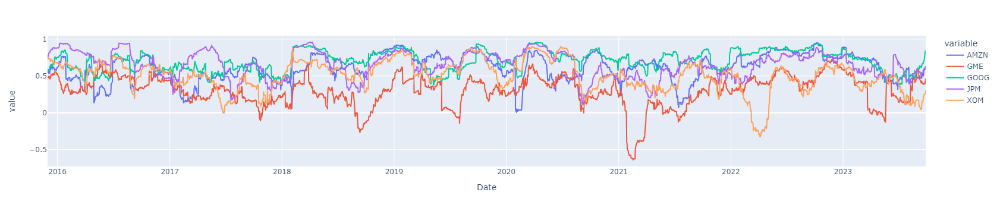

In [4]:
ret = load_ret(tickers, start_date, end_date)
corr = load_corr(tickers, start_date, end_date)
#corr = ret.rolling(window=window, min_periods=window).corr(ret['SPY']).dropna().drop(columns='SPY')
corr.plot(backend='plotly')

#### Find missing values 

* view null counts using a ts plot
* below shows no missing values along the history

In [ ]:
close.isnull().sum(1).plot(backend='plotly')

#### Find outliers 
* using a box plot
* GME has upper outliers, but it relates to the GameStop short squeeze In January 2021, Reddit users on the r/wallstreetbets subreddit built the foundations for a short squeeze on GameStop, pushing up the stock price significantly, validated correctness
* GOOG/XOM's outlier comes from peak period, validated correctness via Google Finance

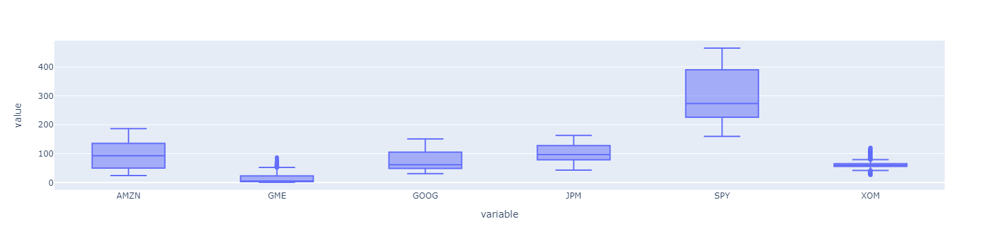

In [9]:
fig = px.box(close)
fig.show()

#### Find anomalies

* using the difference between data from Yahoo Finance and Bloomberg (please ignore last day difference comes from live feed lag if you run during trade hours)
* TODO: there were large spikes in earlier history

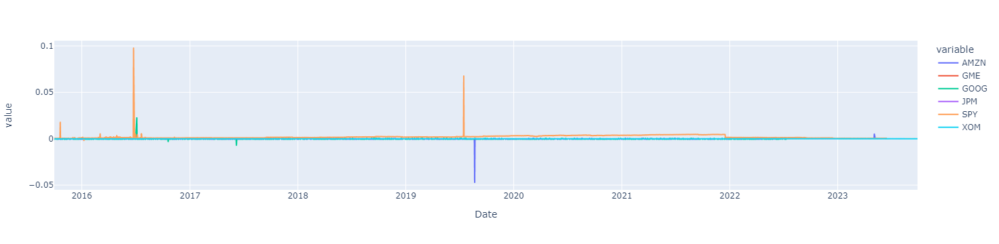

In [10]:
(close - close_blp).iloc[:-1].plot(backend='plotly')

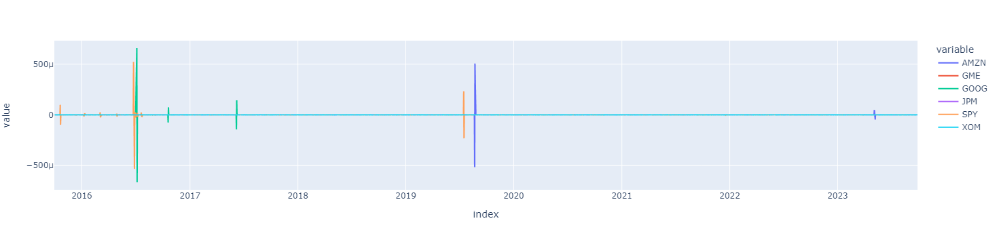

In [11]:
(ret - ret_blp).iloc[:-1].plot(backend='plotly')

### 3. Model selection

A wide array of methods are available for time series forecasting. One of the most commonly used is Autoregressive Moving Average (ARMA), which is a statistical model that predicts future values using past values. This method for making time series predictions is flawed, however, because it doesn’t capture seasonal trends. It also assumes that the time series data is stationary, meaning that its statistical properties wouldn’t change over time. This type of behavior is an idealized assumption that doesn’t hold in practice, however, which means ARMA may provide skewed results. 

An extension of ARMA is the Autoregressive Integrated Moving Average (ARIMA) model, which doesn’t assume stationarity but does still assume that the data exhibits little to no seasonality. Fortunately, the seasonal ARIMA (SARIMA) variant is a statistical model that can work with non-stationary data and capture some seasonality. Additional popular time series forecasting packages are Prophet and DeepAR. Prophet is an additive model developed by Facebook where non-linear trends are fit to seasonality effects such as daily, weekly, yearly and holiday trends. DeepAR is a package developed by Amazon that enables time series forecasting with recurrent neural networks. 

Here, we will build ARMA, ARIMA, SARIMA, Prophet and DeepAR models to make a time series prediction on the future 2m correlation of GOOG, AMZN, JPM, GME, XOM, vs the SPY index.

### 4. Model Training and Validation

#### Splitting Data for Training and Testing

An important part of model building is splitting our data for training and testing, which ensures that you build a model that can generalize outside of the training data and that the performance and outputs are statistically meaningful. 

We will split our data such that everything before 2023 will serve as training data, with everything after 2023 becoming the testing data:

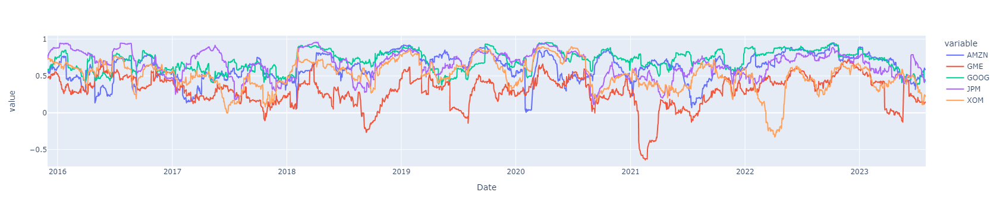

In [5]:
train = corr.iloc[:-window]
test = corr.iloc[-window:]

train.plot(backend='plotly')

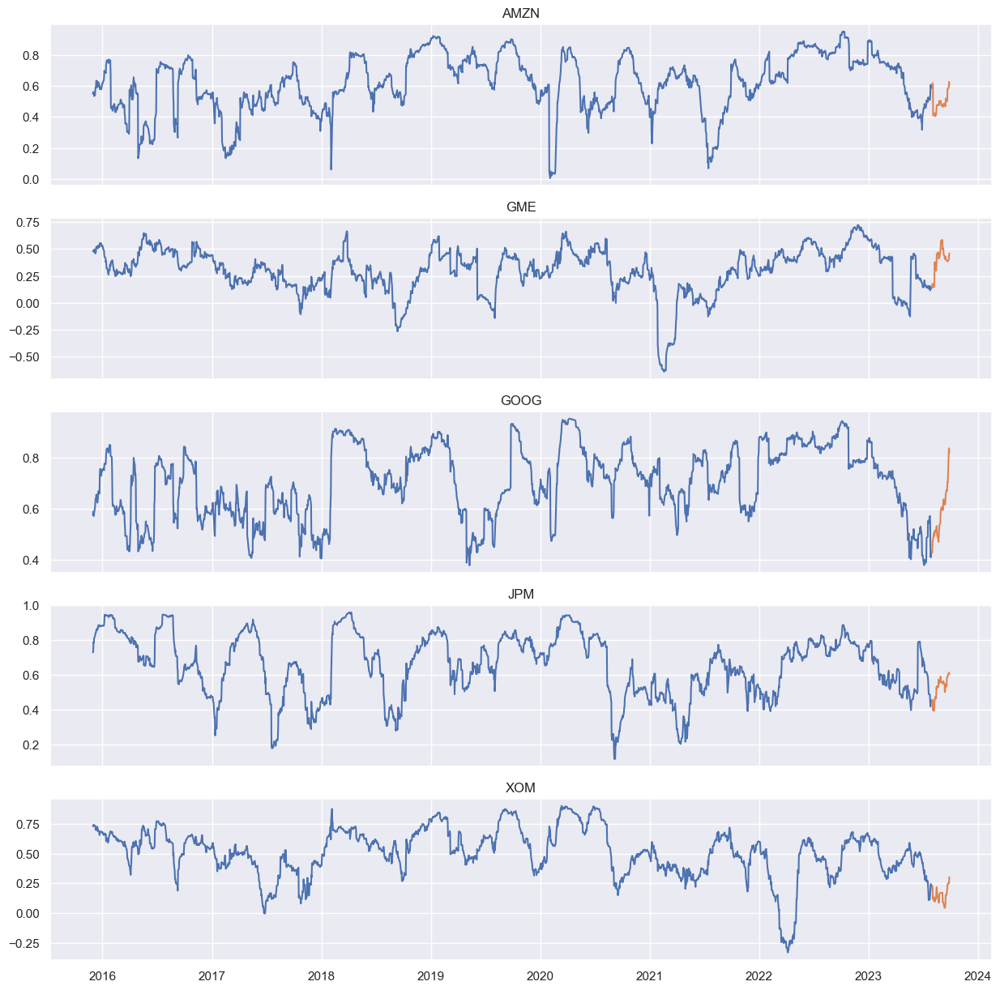

In [6]:
fig, axs = plt.subplots(5, 1, figsize=(15, 15), sharex=True)
for i, t in enumerate(stocks):
    axs[i].plot(train[t].index, train[t])
    axs[i].plot(test[t].index, test[t])
    axs[i].set_title(t)

#### 4.1 Autoregressive Moving Average (ARMA)
ARMA(p, q) model
$$ X_t = \mu + \epsilon_t + \sum^p_{i=1} \varphi_i X_{t-i} + \sum^q_{i=1} \theta_i \epsilon_{t-i}  $$

Define an ARMA model using the ARIMA package with d=0. The model is based on the assumption of stationarity. Due to the nature of index and its constituence, correlation usually between 0 ~ 1, no need to convert to z-score.

In [19]:
# model selection
use_cache = True

if use_cache:
    with open('conf/ARMA_conf.json', 'r') as f:
      ARMAparams = json.load(f)
else:
    from statsmodels.tsa.stattools import arma_order_select_ic
    ARMAparams = {}
    for t in stocks:
        res = arma_order_select_ic(train[t], ic='bic', trend='c')
        ARMAparams[t] = {'order' : list(res['bic_min_order']), 'scoring' : 'bic'}
    with open('conf/ARMA_conf.json', 'w') as f:
        json.dump(ARMAparams, f)

In [20]:
ARMAparams

{'AMZN': {'order': [1, 0], 'scoring': 'bic'},
 'GME': {'order': [1, 0], 'scoring': 'bic'},
 'GOOG': {'order': [2, 0], 'scoring': 'bic'},
 'JPM': {'order': [3, 0], 'scoring': 'bic'},
 'XOM': {'order': [2, 2], 'scoring': 'bic'}}

Generate our predictions (we use independent model per ticker):

In [202]:
for t in stocks:
    ARMAmodel = ARIMA(train[t], order=[params[t]['order'][0], 0, params[t]['order'][1]], trend='c')
    ARMAmodel = ARMAmodel.fit()
    ARMAmodels[t] = ARMAmodel

<b> Analysis </b>

For AMZN, GME, they are ARMA(1, 0), basically just to replicate whatever for yesterday to predict today's. Given the concept of 2 month correlation, only 1 day new dataset, and 41 day old dataset, it is reasonable to predict via yesterday's. Hence, the predict curves (green) are almost linear, same as historical scope.

Looking from Test RMSE vs Test Mean, GME and XOM are really bad, almost random noise. This is also reasonable as GME and XOM are small constituents with big volatility.

,order,scoring,const,ar.L1,sigma2,Test RMSE,Test Mean,ar.L2,ar.L3,ma.L1,ma.L2
AMZN,"[1, 0]",bic,0.616569,0.981935,0.001187,0.119284,0.494707,NaN,NaN,NaN,NaN
GME,"[1, 0]",bic,0.295117,0.983429,0.001465,0.236049,0.400443,NaN,NaN,NaN,NaN
GOOG,"[2, 0]",bic,0.70611,1.083266,0.000641,0.086186,0.584777,-0.101634,NaN,NaN,NaN
JPM,"[3, 0]",bic,0.65653,1.027675,0.000706,0.046868,0.526759,0.050009,-0.090766,NaN,NaN
XOM,"[2, 2]",bic,0.509929,1.91016,0.000898,0.209409,0.150324,-0.912597,NaN,-0.91737,0.0448


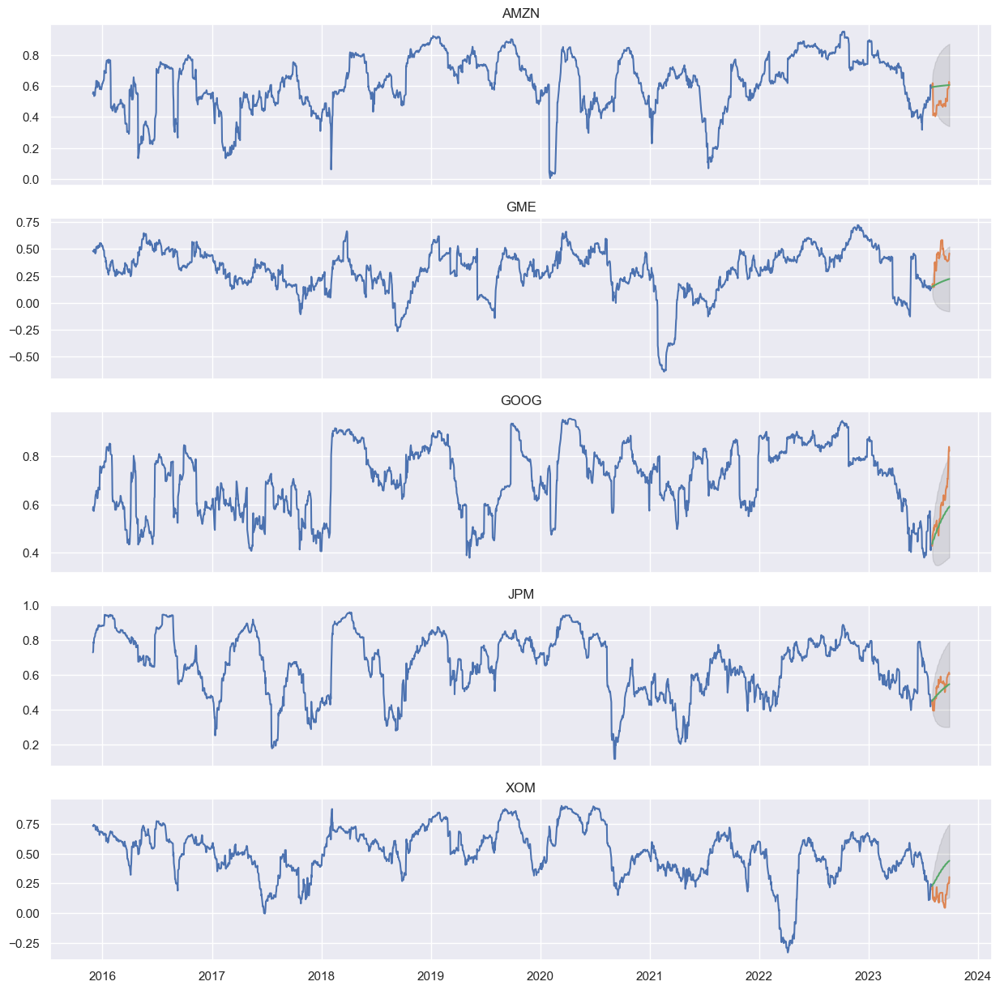

In [204]:
summary, y_pred_out = get_forecast(stocks, params, ARMAmodels, window, test)
plot_forecast(train, test, preds=y_pred_out, mean_col='mean', lower_col='mean_ci_lower', upper_col='mean_ci_upper')
summary

Again, ARMA is limited in that it fails for non-stationary time series and does not capture seasonality. Let’s see if we can improve performance with SARIMA model. 

#### 4.2 Seasonal ARIMA (SARIMA)

Seasonal ARIMA captures historical values, shock events and seasonality. We can define a SARIMA model using the SARIMAX class:

In [217]:
use_cache = True
if use_cache:
    with open('conf/SARIMA_conf.json', 'r') as f:
      SARIMA_params = json.load(f)
else:
    from pmdarima.arima import auto_arima
    SARIMA_params = {}
    for t in ['GOOG']:
        SARIMAXmodel = auto_arima(train[t], d=0, m=21, error_action='ignore', trace=True, suppress_warnings=True, maxiter=50, information_criterion='bic')
        SARIMA_params[t] = {k: v for k, v in SARIMAXmodel.__dict__.items() if k in ['order', 'seasonal_order', 'with_intercept']}
    with open('conf/SARIMA_conf_new.json', 'w') as f:
        json.dump(SARIMA_params, f)

In [218]:
SARIMA_params

{'AMZN': {'order': [1, 0, 0],
  'seasonal_order': [2, 0, 0, 21],
  'scoring': 'mse',
  'with_intercept': True},
 'GME': {'order': [1, 0, 0],
  'seasonal_order': [0, 0, 0, 21],
  'scoring': 'mse',
  'with_intercept': True},
 'GOOG': {'order': [1, 0, 1],
  'seasonal_order': [0, 0, 2, 21],
  'scoring': 'mse',
  'with_intercept': True},
 'JPM': {'order': [3, 0, 0],
  'seasonal_order': [0, 0, 0, 21],
  'scoring': 'mse',
  'with_intercept': True},
 'XOM': {'order': [1, 0, 0],
  'seasonal_order': [0, 0, 0, 21],
  'scoring': 'mse',
  'with_intercept': True}}

In [225]:
SARIMAXmodels = {}
for t in stocks:
    SARIMAXmodel = ARIMA(train[t],
                         order=SARIMA_params[t]['order'],
                         seasonal_order=SARIMA_params[t]['seasonal_order'],
                         trend='c' if SARIMA_params[t]['with_intercept'] else None,
                         freq='B',
                         enforce_invertibility=False)
    SARIMAXmodel = SARIMAXmodel.fit()
    SARIMAXmodels[t] = SARIMAXmodel

<b> Analysis </b>

For AMZN, looking at the sudden drops, it should be an indication of seasonality. After adding the dynamics $X_{t-21}$ and $X_{t-42}$, it achieves a better Test RMSE.

,order,seasonal_order,scoring,with_intercept,const,ar.L1,ar.S.L21,ar.S.L42,sigma2,Test RMSE,Test Mean,ma.L1,ma.S.L21,ma.S.L42,ar.L2,ar.L3
AMZN,"[1, 0, 0]","[2, 0, 0, 21]",mse,True,0.612981,0.981933,-0.088225,-0.020986,0.001177,0.113136,0.494707,NaN,NaN,NaN,NaN,NaN
GME,"[1, 0, 0]","[0, 0, 0, 21]",mse,True,0.295117,0.983429,NaN,NaN,0.001465,0.236049,0.400443,NaN,NaN,NaN,NaN,NaN
GOOG,"[1, 0, 1]","[0, 0, 2, 21]",mse,True,0.696739,0.979975,NaN,NaN,0.000641,0.089728,0.584777,0.095048,0.016078,-0.017468,NaN,NaN
JPM,"[3, 0, 0]","[0, 0, 0, 21]",mse,True,0.65653,1.027675,NaN,NaN,0.000706,0.046868,0.526759,NaN,NaN,NaN,0.050009,-0.090766
XOM,"[1, 0, 0]","[0, 0, 0, 21]",mse,True,0.510651,0.989331,NaN,NaN,0.000912,0.143818,0.150324,NaN,NaN,NaN,NaN,NaN


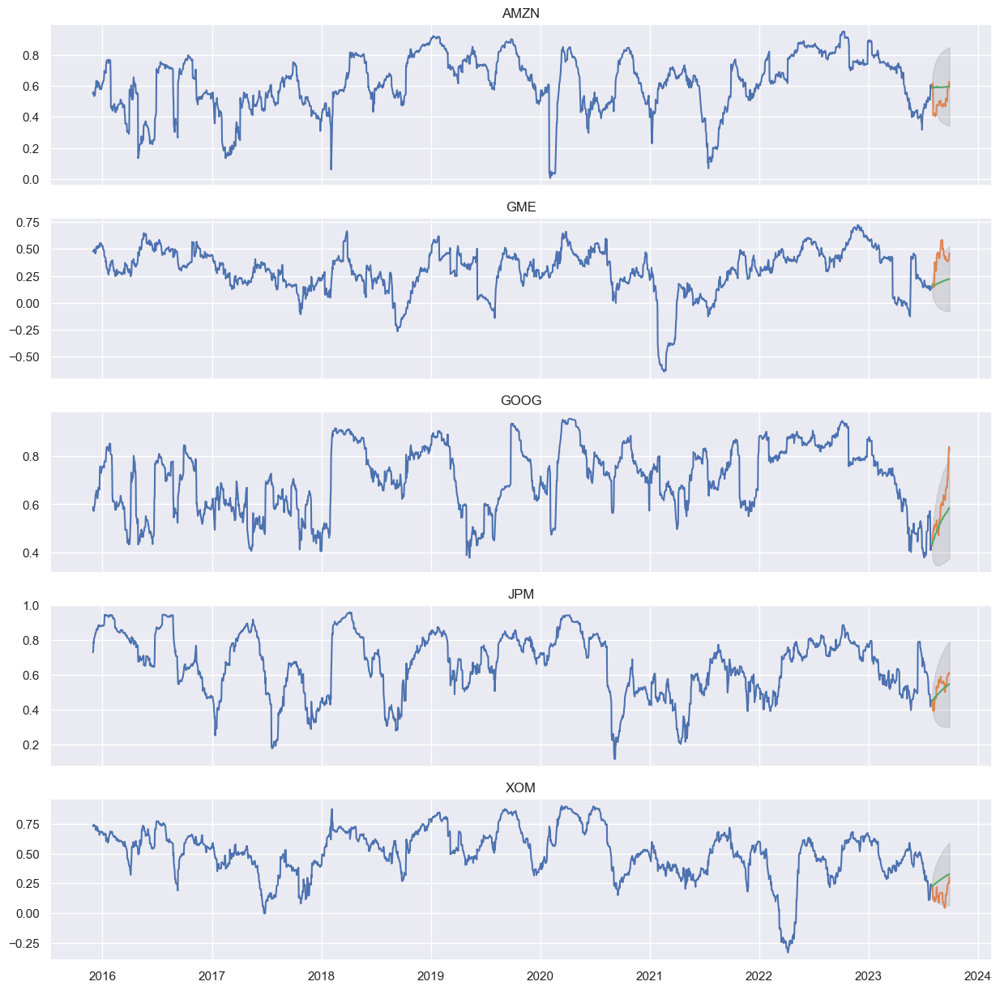

In [226]:
summary, y_pred_out = get_forecasts(stocks, SARIMA_params, SARIMAXmodels, window, test)
plot_forecast(train, test, preds=y_pred_out, mean_col='mean', lower_col='mean_ci_lower', upper_col='mean_ci_upper')
summary

#### 4.4 DeepAR

DeepAR is a model to combine Deep Learning (LSTM) with traditional Probabilistic Forecasting. With below properties:
* Multiple time-series support: The model is trained on multiple time-series, learning global characteristics that further enhance forecasting accuracy.
* Probabilistic output: Instead of making a single prediction, the model leverages quantile loss to output prediction intervals.

In [30]:
train_ds = PandasDataset.from_long_dataframe(train.stack().reset_index().rename(columns={'level_1' : 'stock', 0 : 'corr'}), 
                                             target='corr', item_id='stock', timestamp='Date', freq='B')

Hyper parameter tuning:

| | context_length | num_layers | hidden_size | lr |
| --- | --- | --- | --- | --- | 
| values | 42, 84, 252 | 1, 2 | 30, 40, 50, 60 | 0.001, 0.0005 |
| best | 84 | 1 | 50 | 0.001 | 

Some comments:
* context length is the study period for the model. To better capture seasonality, I tend to give LSTM longer context length.
* The more layers, the more total params to fit, the more overfitting. Given the small dataset, I would stay with single layer. For multi-layer, need to add dropout to avoid overfitting.
* When learning rate is high, it converges quickly in the begining, but later the train loss will become hard to improve in each epoch. With smaller learning rate and higher epochs, it will help to converge and obtain better train loss, but higher chance of overfitting.
* GME and XOM are hard to predict, as they are small constituents and unable to drive S&P index movements. They behave more like white noise.

In [227]:
DeepAR_params = {
    'context_length' : 84,
    'num_layers' : 1,
    'hidden_size' : 50,
    'lr' : 0.001,
    'trainer_kwargs' : {'max_epochs' : 35}
}
use_cache=True
p = Path("conf\DeepAR\context_length={0}num_layers={1}hidden_size={2}lr={3}max_epochs={4}_startdate={5}enddate={6}{7}".format(DeepAR_params['context_length'],
                                                                                                                           DeepAR_params['num_layers'],
                                                                                                                           DeepAR_params['hidden_size'],
                                                                                                                           DeepAR_params['lr'],
                                                                                                                           DeepAR_params['trainer_kwargs']['max_epochs'],
                                                                                                                           start_date,
                                                                                                                           end_date,
                                                                                                                           '_BEST' if use_cache else ''))
if use_cache:
    predictor = Predictor.deserialize(p)
else:
    p.mkdir(exist_ok=True)
    estimator = DeepAREstimator(freq='B', prediction_length=42, **DeepAR_params)
    predictor = estimator.train(train_ds, num_workers=2)
    predictor.serialize(p)

C:\Users\jessi\anaconda3\Lib\site-packages\torch\nn\modules\rnn.py:71: UserWarning:

dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1



,Test RMSE,Test Mean
AMZN,0.121522,0.494707
GME,0.240032,0.400443
GOOG,0.120572,0.584777
JPM,0.040366,0.526759
XOM,0.143721,0.150324


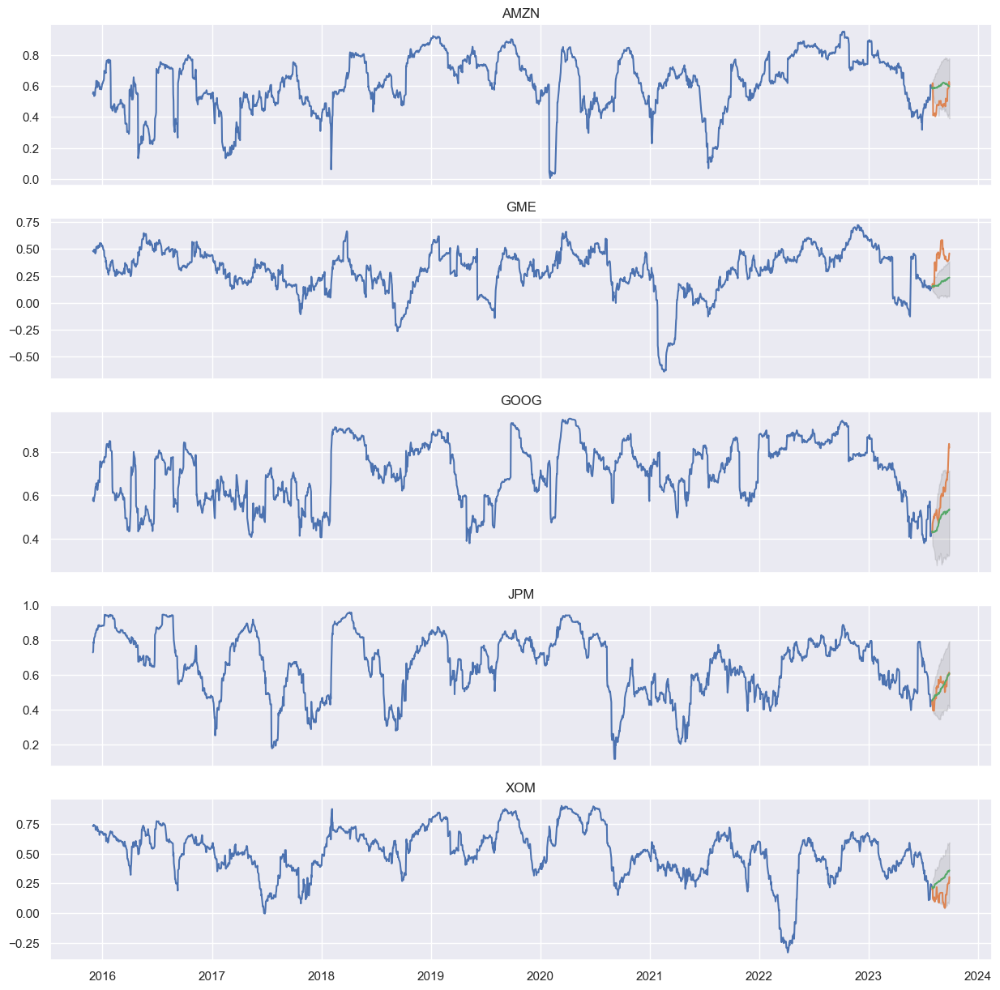

In [229]:
summary, all_preds = get_deep_ar_forecast(train_ds, predictor, window, test)
plot_forecast(train, test, all_preds, mean_col='mean', lower_col='mean_ci_lower', upper_col='mean_ci_upper')
summary